In [72]:
# MOUDILA Marcel
# 6 mars 2024

### Détection d'objets dans un flux vidéo en temps réel (exemple caméra PC pour ce notebook)

Dans cet exemple, j'ai testé l'algorithme de détection d'objets en temps réel (YOLO -  You Only Live Once) dans une rue. 
La caméra embarquée dans mon PC a enregistré une courte vidéo et j'affiche ici dans ce notebook les détections et classifications réalisées en 
temps réel par l'algorithme. 

YOLO est un modèle Deep Learning basé sur des architectures de réseaux de neurones CNNs conçu pour une détection rapide et précise en temps réels des objets dans des images ou séquence vidéo. Jusqu'à présent, il a surpassé toutes les méthodes précédentes, surtout dans le domaine de la conduite autonome et de la surveillance.

In [73]:
# OpenCV est déjà installé sur ma machine (on l'appelle par import cv2)

import cv2
import numpy as np


In [74]:
# on charge le module YOLO  qui est enregistré dans le même dossier que ce notebook
# yolov4.cfg , et yolov4.weights sont disponible en téléchargement en ligne 

net = cv2.dnn.readNetFromDarknet('yolov4.cfg', 'yolov4.weights')
net


< cv2.dnn.Net 0x7f63b4357ef0>

In [75]:
# nombre de ccouhes dans le réseau YOLO (yolov4.cfg)
len (net.getLayerNames())

379

In [76]:
# indice des couches de sorties non connectées
net.getUnconnectedOutLayers()

array([327, 353, 379], dtype=int32)

In [77]:
net.getLayerNames()[326]

'yolo_139'

In [78]:
net.getLayerNames()[352]

'yolo_150'

In [79]:
net.getLayerNames()[378]

'yolo_161'

In [80]:
ln = ['yolo_139', 'yolo_150','yolo_161']


In [81]:
DEFAULT_CONFIANCE = 0.5
THRESHOLD = 0.4
# le fichier des labels (coco.names) est disponible en téléchargement en ligne
with open('coco.names', 'r') as f:
    LABELS = f.read().splitlines()
    

In [82]:
# 5 exemples de labels 
LABELS[0:6]

['person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus']

In [83]:
# nombre de  labels 
len(LABELS)

80

In [84]:
# flux vidéo (0 = webcam pour système Linux)
cap = cv2.VideoCapture(0)

In [85]:
# enregistrement vidéo
fourcc = cv2.VideoWriter_fourcc(*'XVID')  # 'MJPG' pour des fichiers plus grands
out = cv2.VideoWriter('output_video.avi', fourcc, 20.0, (width, height))

In [86]:


while True:
    _,image=cap.read()
    height, width, _ = image.shape

    # prétraitement (normalisation, dimensionnement, etc) de chaque image par YOLO
    blob = cv2.dnn.blobFromImage(image, 1/255, (416, 416), (0,0,0), swapRB=True, crop=False)
    net.setInput(blob)
    layerOutputs = net.forward(ln)

    # création liste des informations à calculer 
    boxes = []
    confidences = []
    classIDs = []

    for output in layerOutputs:
        for detection in output:
            scores = detection[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]

            if confidence > DEFAULT_CONFIANCE:
                
                box = detection[0:4] * np.array([width, height, width, height])
                (centerX, centerY, W, H) = box.astype("int")
                
                x = int(centerX - (W / 2))
                y = int(centerY - (H / 2))
                
                boxes.append([x, y, int(W), int(H)])
                confidences.append(float(confidence))
                classIDs.append(classID)

    # Applique la suppression non maximale (NMS) pour éliminer les boîtes englobantes redondantes ou faibles.            
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, DEFAULT_CONFIANCE, THRESHOLD)    

    # liste aléatoire des couleurs des boxes 
    COLORS = np.random.uniform(0,255,size=(len(boxes), 3)) 


    if len(indexes) > 0:
        
        for i in indexes.flatten():
            # x et y forment le centre d'un rectangle contenant un label, w et h ses dimensions
            (x, y, w, h) = boxes[i]
            
            color = COLORS[i]
            text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, text, (x, y + 20 ), cv2.FONT_HERSHEY_PLAIN, 2, color, 2)

    
    # Enregistrement de chaque frame dans la vidéo de sortie
    out.write(image)

    # Affiche l'image résultante avec les détections en temps réel.
    # La boucle s'arrête si la touche 'q' est enfoncée.
    cv2.imshow('Image', image)
    if cv2.waitKey(1)==ord('q'):    
        break

# fermeture de la caméra
cap.release()
out.release()
cv2.destroyAllWindows()            
    
           



            
        
    

In [87]:
# cette installation est nécessaire pour utiliser les vidéos dans jupyter notebook
#pip install imageio[ffmpeg]


In [88]:


import imageio
from IPython.display import display, HTML
import time
import base64




/tmp/ipykernel_358984/3922006058.py:6: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  img_str = cv2.imencode('.png', frame)[1].tostring()



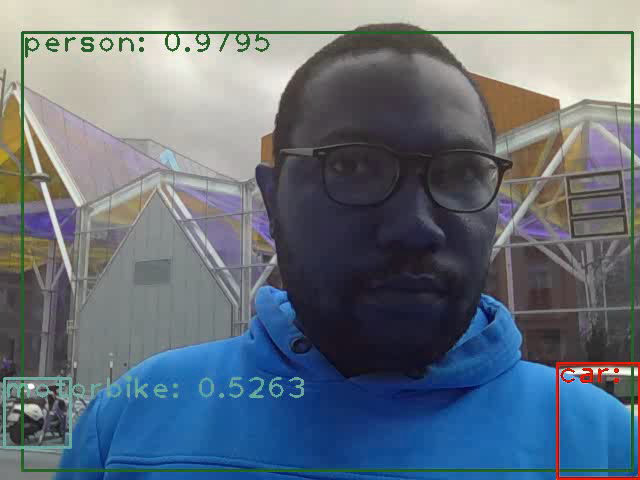


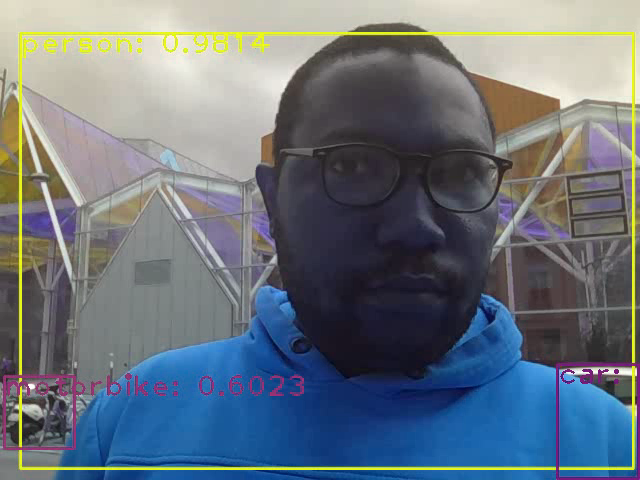


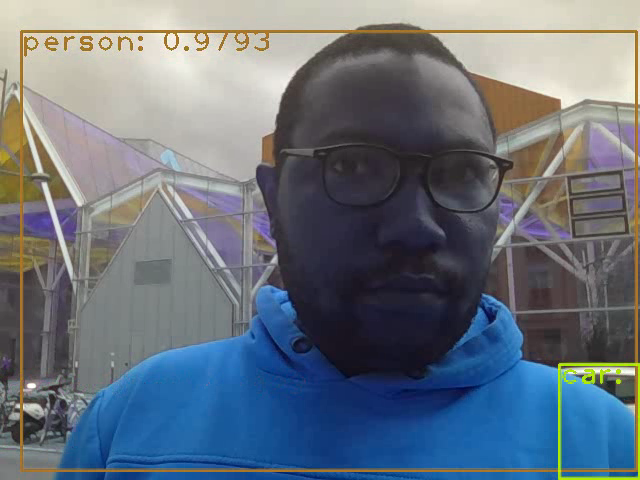


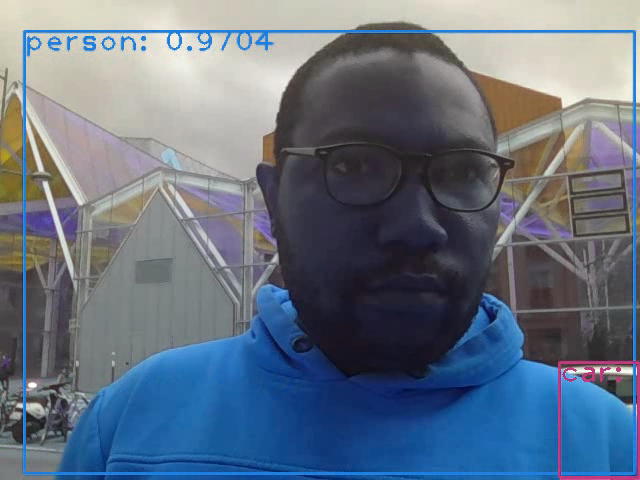


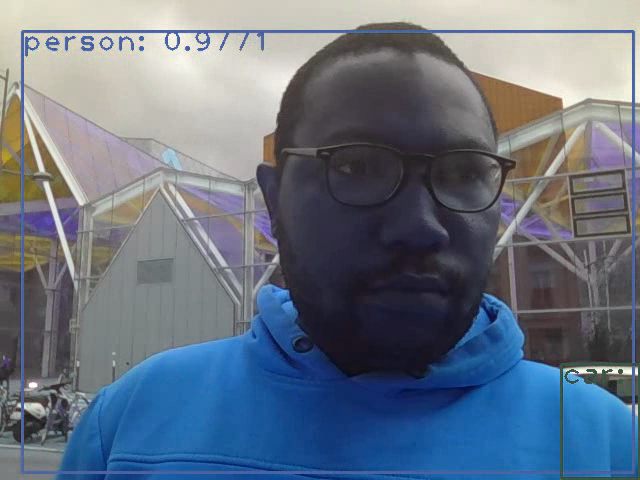


...


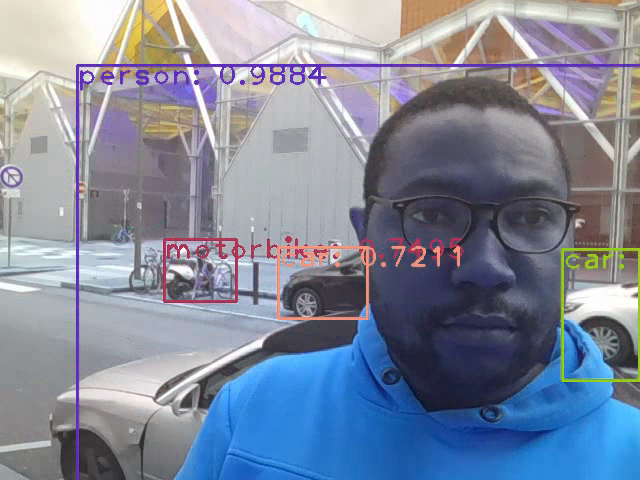


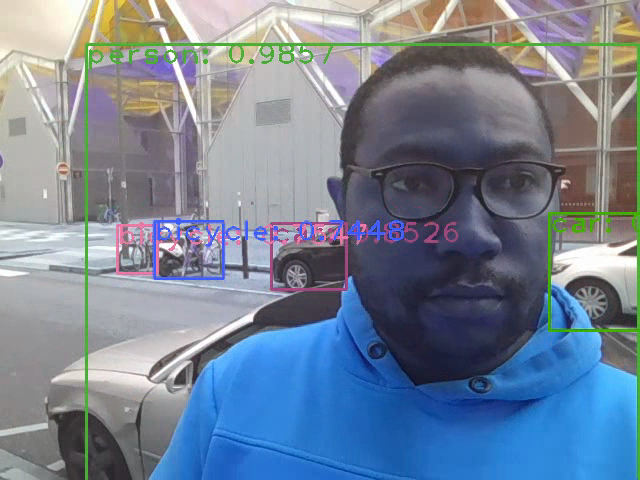


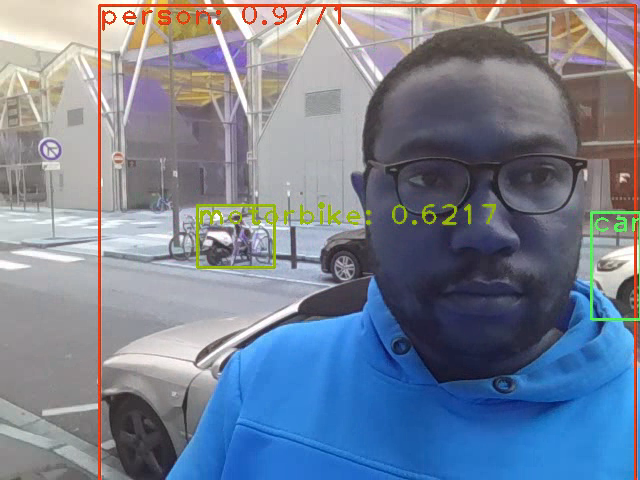


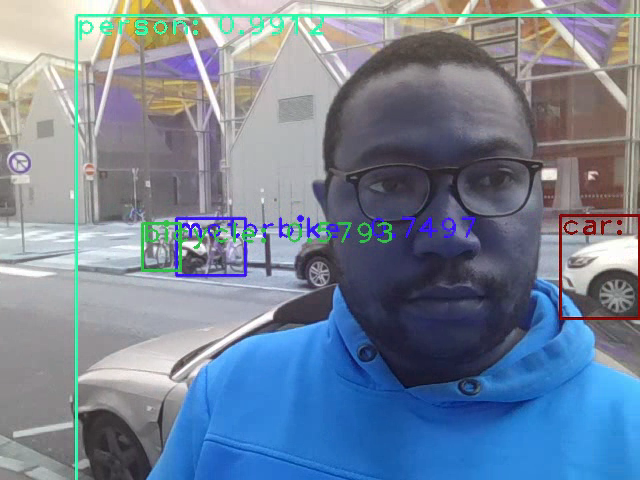


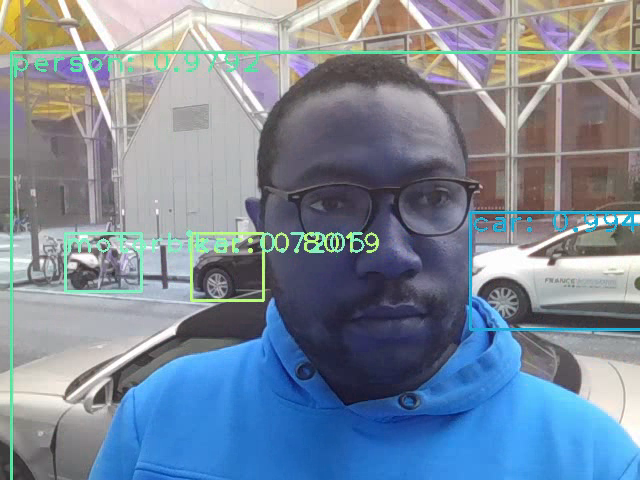

In [89]:



video_path = '/home/moudilamarcel/Bureau/data/output_video.avi'
video = imageio.get_reader(video_path)

for frame in video:
    # Convertir l'image pour l'afficher dans la cellule
    img_str = cv2.imencode('.png', frame)[1].tostring()
    img_html = f'<img src="data:image/png;base64,{base64.b64encode(img_str).decode()}"/>'
    
    # Afficher l'image dans la cellule
    display(HTML(img_html))

    
    time.sleep(0.1)




